In [1]:
cd ..

C:\Users\kevin\Documents\Workspace\psylit-experiments


In [2]:
import numpy as np
from collections import UserDict, Counter, defaultdict, namedtuple
from itertools import islice
import plotly.plotly as py
import plotly.graph_objs as go
import pandas as pd
import seaborn as sns
import math

In [3]:
import plotly
import plotly.graph_objs as go

plotly.offline.init_notebook_mode(connected=True)

In [4]:
from tic.recnet import RecNet
from tic.utils import read_tokens

In [5]:
toks = list(read_tokens(r'outputs\ch1_affect.tsv', sep='\t'))

In [15]:
def plot_recnet(recnet, layout=None, show_labels=False):
    lyt = recnet.cascades_layout(layout)

    edge_trace = go.Scattergl(
        x=lyt['edges']['x'],
        y=lyt['edges']['y'],
        line=dict(color='rgba(125, 125, 125, 0.4)', width=.8),
        mode='lines' + ('+text' if show_labels else ''),
    )

    node_trace = go.Scattergl(
        x=lyt['nodes']['x'],
        y=lyt['nodes']['y'],
        text=lyt['nodes']['text'],
        mode='markers' + ('+text' if show_labels else ''),
        hoverinfo='text',
        textposition='top center',
        marker=dict(
            showscale=True,
            # colorscale options
            #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
            #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
            #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
            colorscale='YlGnBu',
            reversescale=True,
            color=lyt['nodes'].get('f') or 'black',
            size=4,
            opacity=0.6,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line=dict(
                color='white', # would like to put Fe here but not supported :(
                width=0.3,
            ))
    ) 

    layout = dict(
        title='Recurrence network',
        xaxis=dict(
            rangeselector=dict(
                buttons=[
                    dict(step='all')
                ]
            ),
            rangeslider=dict(
                visible = True,
            ),
            type='linear',
            range=[0,50],
        ),
    )

    fig = go.Figure(data=[edge_trace,node_trace], layout=layout)

    plotly.offline.iplot(fig)#, filename='basic-line')


In [7]:
net2 = RecNet(toks)
#net2.summary()

In [16]:
plot_recnet(net2)

AttributeError: 'tuple' object has no attribute 'get'

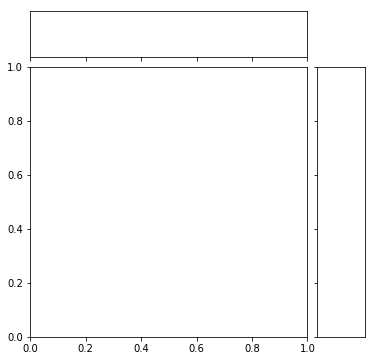

In [17]:
df = net2.df()
sns.jointplot('indeg', 'outdeg', data=df)

In [ ]:
sns.lineplot(data=df, x='t', y='entropy')

In [ ]:
sns.distplot((df.outdeg - 1) - (df.indeg - 1))

In [ ]:
from matplotlib import pyplot as plt
plt.plot((df.outdeg - 1))
plt.show()

In [ ]:
{k: v.shape if hasattr(v, 'shape') else len(v) for k, v in df[0].items()}